In [1]:
import numpy as np
import pickle
import random
import time
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import PIL
from PIL import Image
from sklearn.neighbors import NearestNeighbors

import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
%cd ..

/


In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
import pickle

BASE_PATH = '/content/drive/MyDrive/ahrefs/features'

filenames = pickle.load(
    open(BASE_PATH + '/filenames-caltech101.pickle', 'rb')
)

feature_list = pickle.load(
    open(BASE_PATH + '/features-caltech101-resnet.pickle', 'rb')
)

class_ids = pickle.load(
    open(BASE_PATH + '/class_ids-caltech101.pickle', 'rb')
)

In [5]:
filenames = [filename[1:] for filename in filenames] # remove first / to turn absolute from colab to relative

In [6]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)


Number of images =  9144
Number of features per image =  2048


# Sklearn NearestNeighbors Brute Force

In [7]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

In [8]:
BASE_DATASET_PATH = '/content/drive/MyDrive/caltech-101/101_ObjectCategories'

# Fix paths
filenames = [BASE_DATASET_PATH + '/' + f.split('101_ObjectCategories/')[-1] for f in filenames]

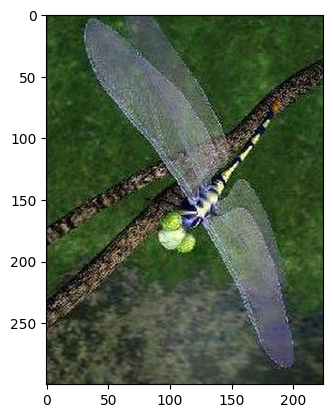

In [9]:
random_index = 5000
distances, indices = neighbors.kneighbors([feature_list[random_index]])
plt.imshow(mpimg.imread(filenames[random_index]), interpolation='lanczos')

In [10]:
distances, indices

(array([[1.07895930e-05, 2.33447800e+02, 2.41832596e+02, 2.48520187e+02,
         2.49700485e+02]]),
 array([[5000, 5048, 5046, 6856, 6862]]))

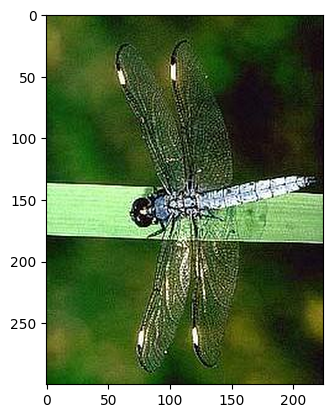

In [11]:
plt.imshow(mpimg.imread(filenames[indices[0][1]]), interpolation='lanczos')

In [12]:
# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) // columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]), color='r')
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.axis('off')
        plt.imshow(image)

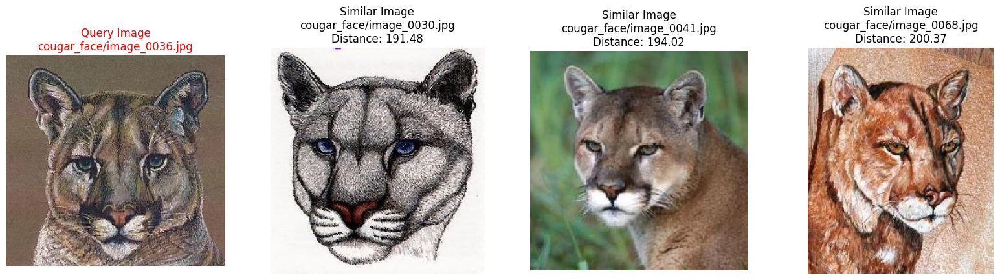

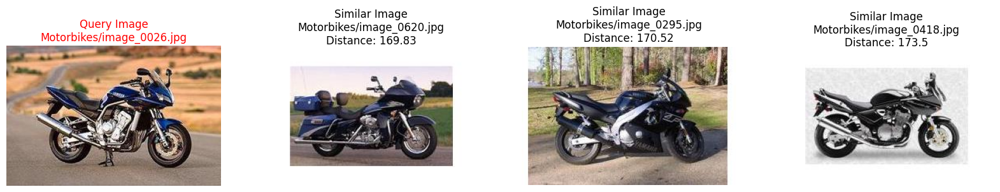

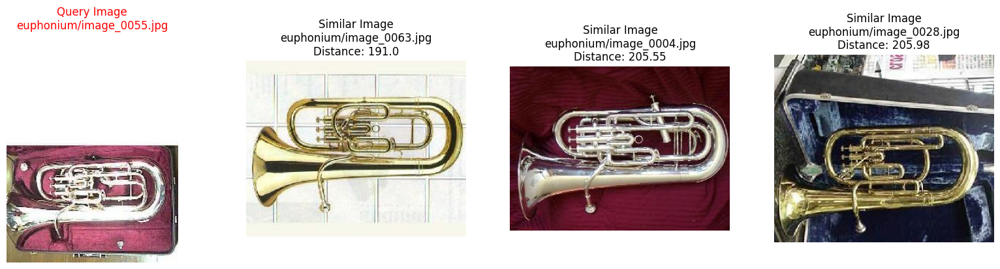

In [13]:
# Interesting finds
for _ in range(3):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors([feature_list[random_image_index]])
    similar_image_paths = [filenames[random_image_index]] + [filenames[indices[0][i]] for i in range(1, 4)]   # Top 3 similar images, excluding itself at index 0
    plot_images(similar_image_paths, distances[0])

In [14]:
neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))
print("Median distance among most similar photos: ",
      np.median(distances[:, 2]))

Median distance between all photos:  304.6669616699219
Max distance between all photos:  484.8629455566406
Median distance among most similar photos:  197.36602020263672


In [15]:
start, end = 6000,7000
selected_features = feature_list[start:end]
selected_class_ids = class_ids[start:end]
selected_filenames = filenames[start:end]

# TSNE to visualize clusters
- Argument against TSNE (Cloud watching): https://stats.stackexchange.com/questions/263539/clustering-on-the-output-of-t-sne/264647#264647

In [16]:
from sklearn.manifold import TSNE

# You can play with these values and see how the results change
n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = 'euclidean'

time_start = time.time()
tsne_results = TSNE(n_components=n_components,
                    verbose=verbose,
                    perplexity=perplexity,
                    n_iter=n_iter,
                    random_state=1,
                    metric=metric).fit_transform(selected_features)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computed neighbors for 1000 samples in 0.260s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 67.516005
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.171478
[t-SNE] KL divergence after 1000 iterations: 0.658534
t-SNE done! Time elapsed: 7.0284178256988525 seconds


/tmp/ipykernel_16463/1286269066.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap('coolwarm')


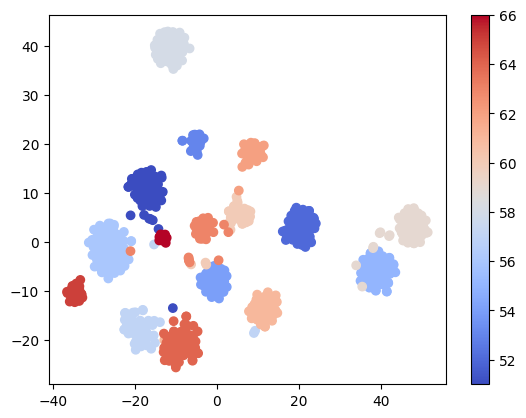

In [17]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

In [25]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data


def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [26]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

## TSNE without PCA

AttributeError: module 'PIL.Image' has no attribute 'ANTIALIAS'

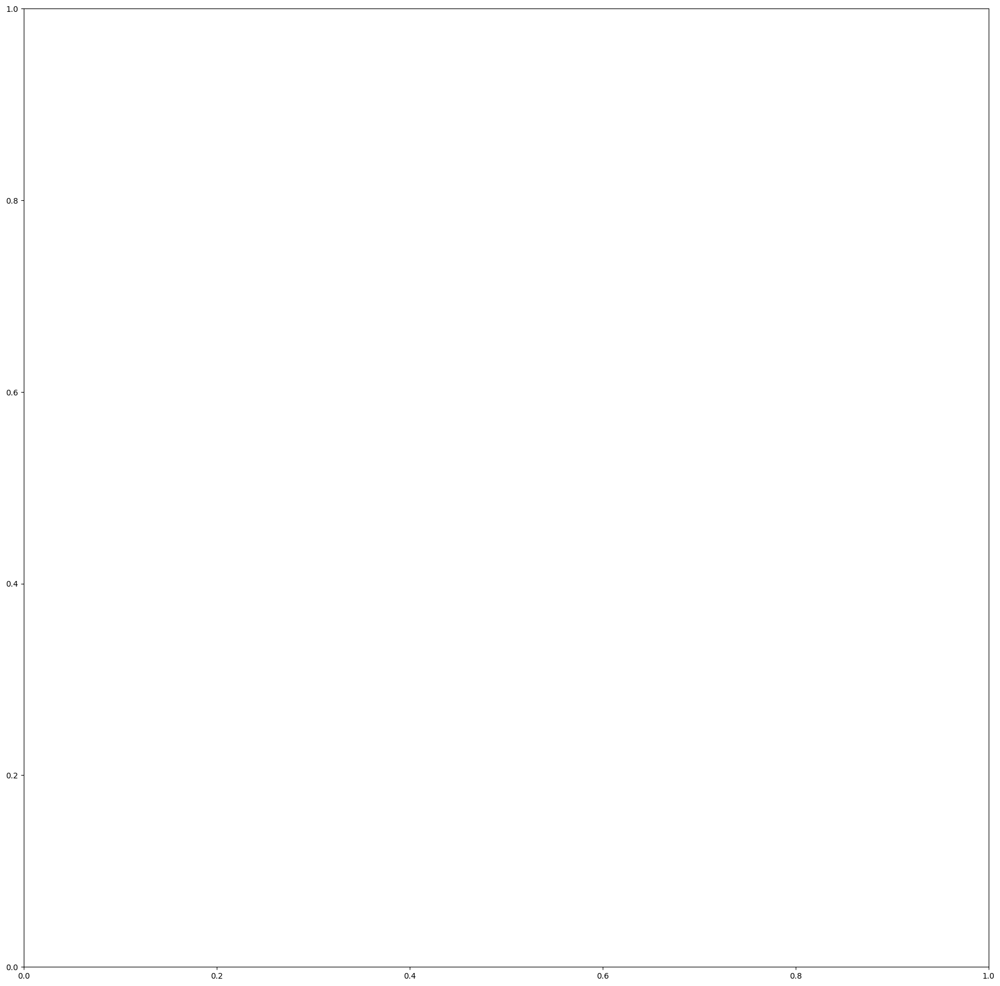

In [29]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [30]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()

    x, y = np.atleast_1d(x, y)

    for x0, y0, image_path in zip(x, y, image_paths):
        try:
            image = Image.open(image_path)
            image.thumbnail((100, 100), Image.Resampling.LANCZOS)  # ✅ FIX

            img = OffsetImage(image, zoom=zoom)
            anno_box = AnnotationBbox(img, (x0, y0),
                                      xycoords='data',
                                      frameon=False)
            axis.add_artist(anno_box)
        except:
            continue  # skip bad images

    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()


def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)

    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)

    plt.axis('off')
    plt.show()

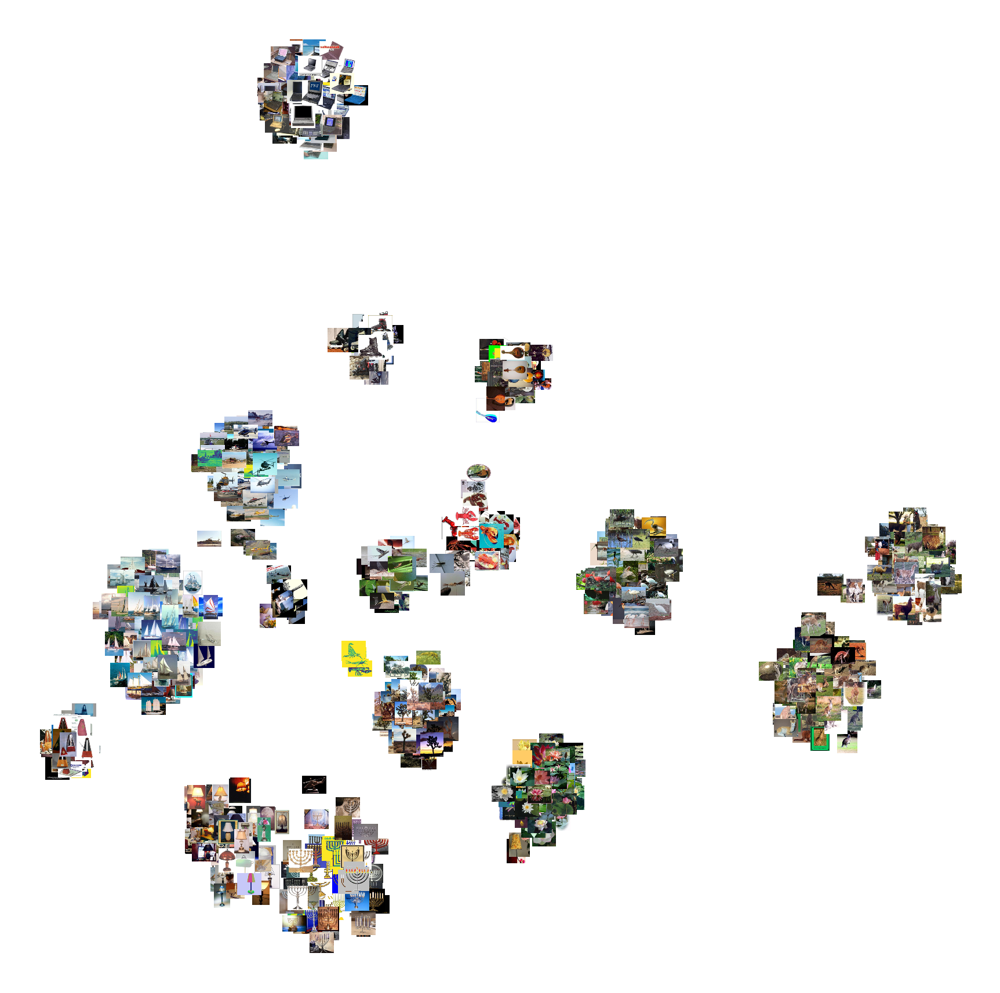

In [31]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

## TSNE with PCA

- To reduce dimensions to speed up indexing and search
- After reducing 2048 to 100 dimensions, nearest neighbors are still generally correct

In [32]:
num_feature_dimensions = 100
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

PCA(n_components=100)

In [33]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

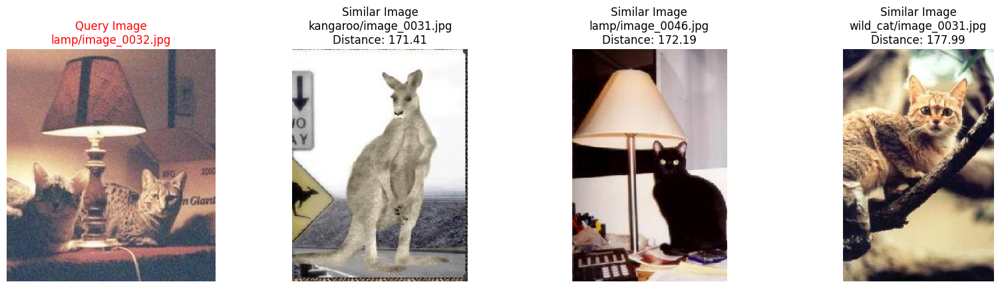

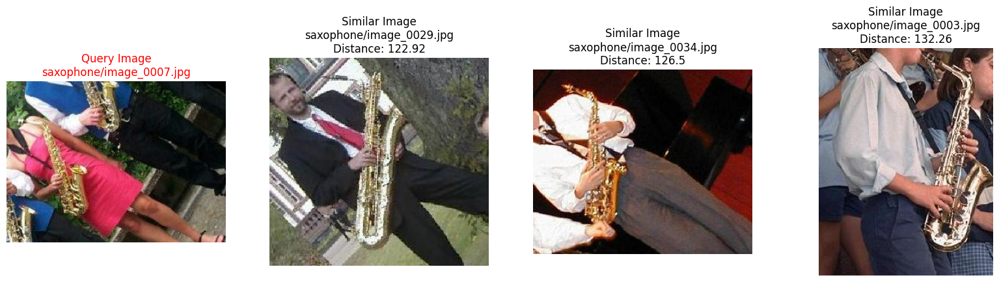

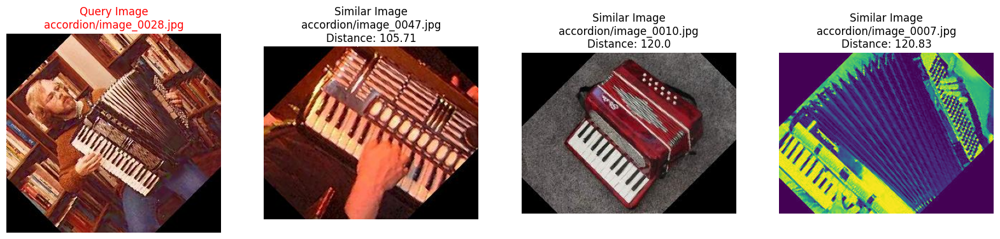

In [34]:
for _ in range(3):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list_compressed[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [35]:
start, end = 6000,7000
selected_features = feature_list_compressed[start:end]
selected_class_ids = class_ids[start:end]
selected_filenames = filenames[start:end]

time_start = time.time()
tsne_results = TSNE(n_components=2, verbose=1,
                    metric='euclidean').fit_transform(selected_features)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.032s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 55.235527
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.096497
[t-SNE] KL divergence after 1000 iterations: 0.575094
t-SNE done! Time elapsed: 5.214305400848389 seconds


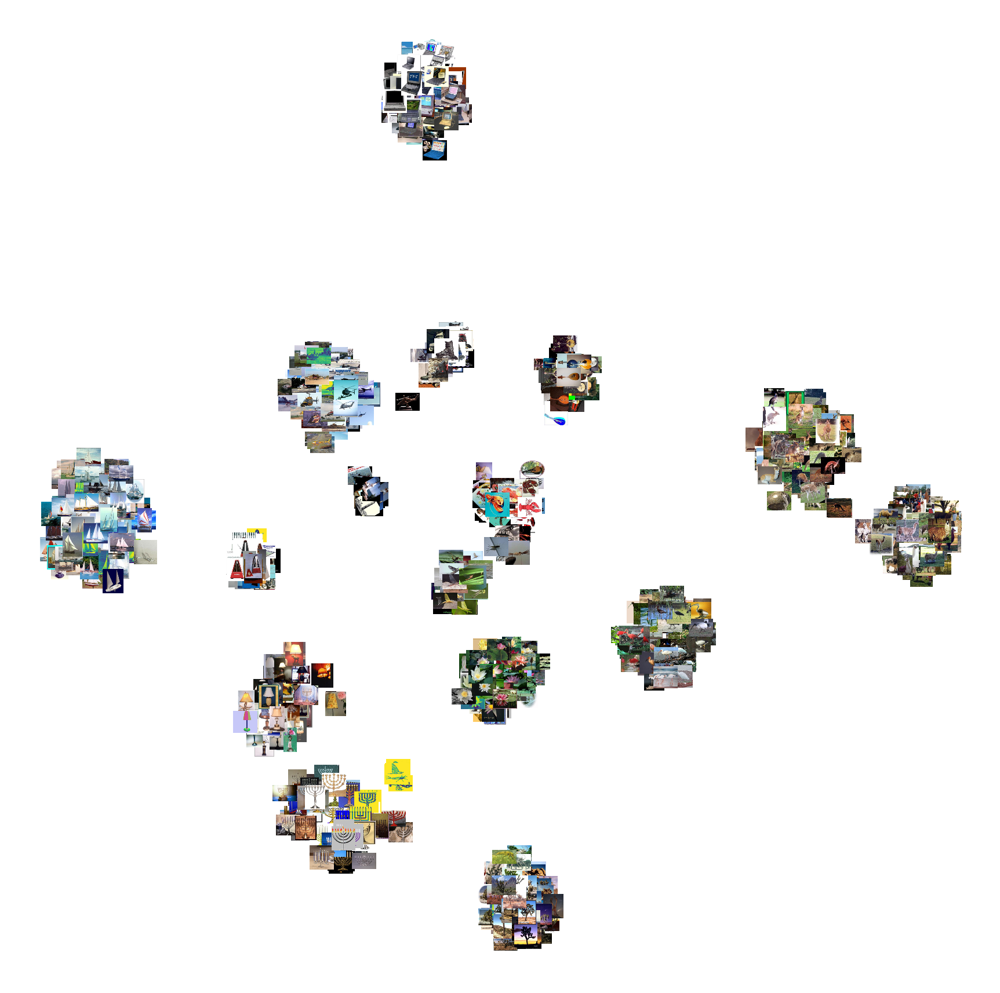

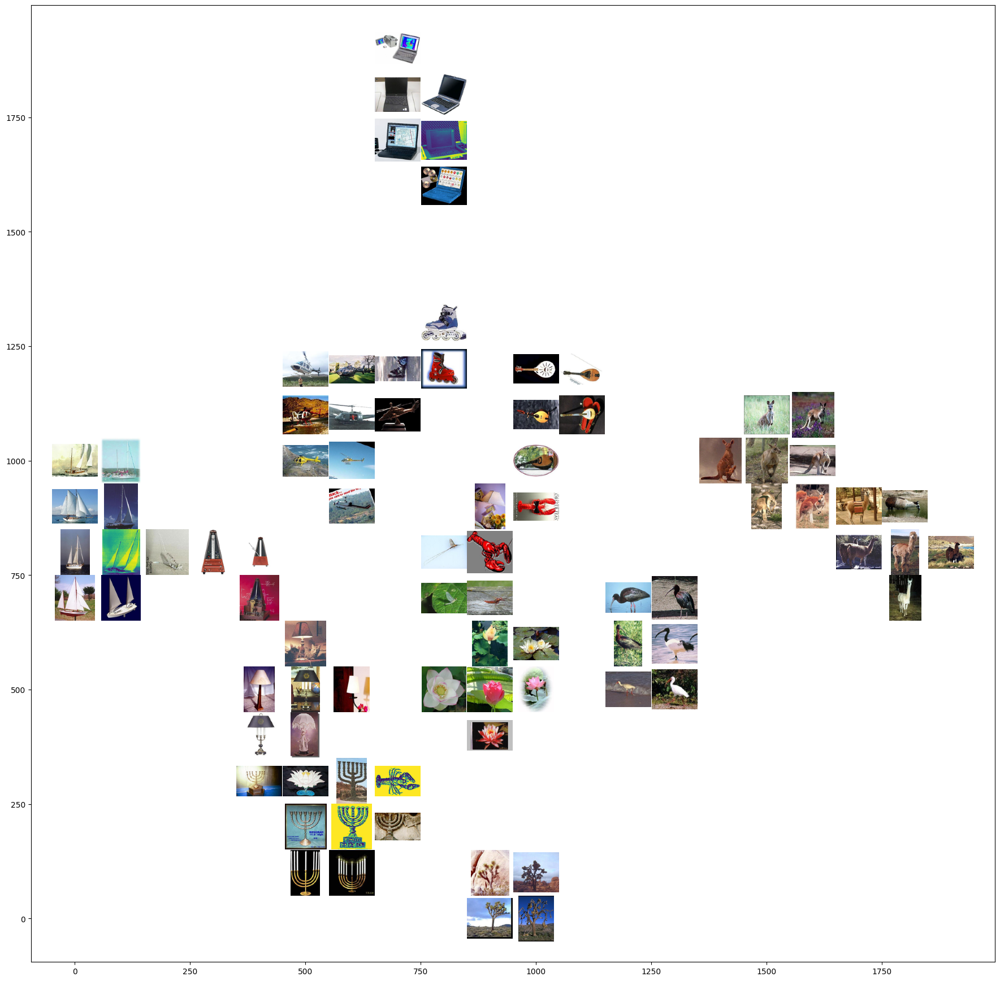

In [36]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

# Timing experiments

- Without PCA
    - Kmeans Brute
    - Kmeans BallTree
    - Annoy

- With PCA
    - Kmeans Brute
    - Kmeans BallTree
    - Annoy

In [37]:
# search a random list of 100 images
random_image_indices = random.sample(range(0, num_images), 100)
random_feature_list = [feature_list[each_index] for each_index in random_image_indices]

## Kmeans Brute

In [43]:
%%timeit
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

7.7 ms ± 109 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [44]:
%%timeit
neighbors.kneighbors(random_feature_list)

ValueError: X has 2048 features, but NearestNeighbors is expecting 100 features as input.

In [40]:
random_feature_list_pca = pca.transform(random_feature_list)

neighbors.kneighbors(random_feature_list_pca)

(array([[3.77153777e-05, 1.37992536e+02, 1.39755156e+02, 1.50043348e+02,
         1.50783616e+02],
        [3.66389708e-05, 1.24499739e+02, 1.25398249e+02, 1.29095044e+02,
         1.29941576e+02],
        [4.17443631e-05, 1.44865770e+02, 1.46730363e+02, 1.49701528e+02,
         1.57670157e+02],
        [5.22348936e-05, 9.23105377e+01, 9.45212252e+01, 9.48229483e+01,
         9.71512304e+01],
        [4.13063199e-05, 1.15342331e+02, 1.19545681e+02, 1.23058784e+02,
         1.26003087e+02],
        [5.79155977e-05, 1.15526023e+02, 1.21638945e+02, 1.25250621e+02,
         1.28415173e+02],
        [3.84793110e-05, 9.69731537e+01, 1.16999592e+02, 1.17136902e+02,
         1.19040742e+02],
        [5.05717223e-05, 1.24792936e+02, 1.34083319e+02, 1.34967343e+02,
         1.36345291e+02],
        [4.13063199e-05, 1.36481128e+02, 1.39689564e+02, 1.44997503e+02,
         1.50305256e+02],
        [3.12246428e-05, 4.17284843e+01, 7.58868911e+01, 7.82403503e+01,
         8.68383241e+01],
        [4

In [41]:
%%timeit

random_feature_list_pca = pca.transform(random_feature_list)
neighbors.kneighbors(random_feature_list_pca)

34.9 ms ± 13.4 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [46]:
# Transform query
random_feature_list_pca = pca.transform(random_feature_list)

%timeit neighbors.kneighbors(random_feature_list_pca)

38.5 ms ± 15.9 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Kmeans BallTree

In [47]:
%%timeit
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='ball_tree',
                             metric='euclidean').fit(feature_list)

3.61 s ± 1.32 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [51]:
%%timeit neighbors.kneighbors(random_feature_list)

246 ms ± 80.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Annoy

In [53]:
!pip install annoy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 32.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for annoy: filename=annoy-1.17.3-cp312-cp312-linux_x86_64.whl size=549278 sha256=4327ef2f0316561312a7de4956f9e17ccd78a6b9869e0a83964fed6c68595a6d
  Stored in directory: /root/.cache/pip/wheels/db/b9/53/a3b2d1fe1743abadddec6aa541294b24fdbc39d7800bc57311
Successfully built annoy


In [54]:
from annoy import AnnoyIndex

t = AnnoyIndex(2048)  # Length of item vector that will be indexed
starttime = time.time()
for i in range(num_images):
    feature = feature_list[i]
    t.add_item(i, feature)
endtime = time.time()
print('Indexing Time: ', endtime - starttime)
t.build(20)

/tmp/ipykernel_16463/4204520612.py:3: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(2048)  # Length of item vector that will be indexed


Indexing Time:  6.648853302001953


True

In [55]:
%%time
for i in range(0, 100):
    t.get_nns_by_vector(feature_list[random_image_index], 5, include_distances=True)

CPU times: user 109 ms, sys: 0 ns, total: 109 ms
Wall time: 109 ms


## Kmeans Brute (PCA)

In [56]:
%%timeit
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)

804 µs ± 394 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [57]:
%%timeit
neighbors.kneighbors(random_feature_list)

122 ms ± 1.84 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Kmeans BallTree (PCA)

In [58]:
%%timeit
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='ball_tree',
                             metric='euclidean').fit(feature_list_compressed)

65.5 ms ± 13 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [59]:
%%timeit
neighbors.kneighbors(random_feature_list)

143 ms ± 26.2 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


## Annoy (PCA)

In [60]:
from annoy import AnnoyIndex

t = AnnoyIndex(100)  # Length of item vector that will be indexed
starttime = time.time()
for i in range(num_images):
    feature = feature_list_compressed[i]
    t.add_item(i, feature)
endtime = time.time()
print('Indexing Time: ', endtime - starttime)
t.build(20)

/tmp/ipykernel_16463/820826380.py:3: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(100)  # Length of item vector that will be indexed


Indexing Time:  0.1009681224822998


True

In [61]:
%%timeit
for i in range(0, 100):
    t.get_nns_by_vector(feature_list_compressed[random_image_index], 5, include_distances=True)

2.03 ms ± 532 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


# Timing Result Summary
- Significant reductions in search time when using Annoy at 100 dimensions after PCA

| Algorithm | Number of Features | Index Time(ms) | Search time(ms) (100 images) |
| --- | --- | --- | --- |
| KNN Brute | 2048 | 11 | 174 |
| KNN Ball Tree | 2048 | 2860 | 193 |
| Annoy | 2048 | 3290 | 129 |
| KNN Brute (PCA)| 100 | 0.667 | 163 |
| KNN Ball Tree (PCA)| 100 | 49 | 166 |
| Annoy (PCA)| 100 | 255 | <font color='red'>3</font> |

# Comparing Accuracies
- Fraction of all neighbors from all queries that have true label (based on label, not brute force nearest distance)
- If brute force accuracy is already not 100%, even if approximate neighbors measure 100% against brute force neighbors, results may not practically be useful

In [62]:
class_ids = pickle.load(open('features/class_ids-caltech101.pickle', 'rb'))  # 9144 class ids ranging 0-101

def accuracy(feature_list):
    neighbors = NearestNeighbors(n_neighbors=5,
                                algorithm='brute',
                                metric='euclidean').fit(feature_list)

    distances, indices = neighbors.kneighbors(feature_list)

    neighbors_class_ids = class_ids[indices] # using indices to get class ids, neighbors_class_ids.shape is (9144, 5) with values representing class ids ranging 0-101
    class_equalities = np.equal(neighbors_class_ids[:, [0]], neighbors_class_ids[:, 1:5])  # column 0 is class of itself, columns 1 to 4 are neighbors
    print('Accuracy: ', class_equalities.mean())

FileNotFoundError: [Errno 2] No such file or directory: 'features/class_ids-caltech101.pickle'

In [63]:
import pickle
import numpy as np
from sklearn.neighbors import NearestNeighbors

BASE_PATH = '/content/drive/MyDrive/ahrefs/features'

class_ids = pickle.load(
    open(BASE_PATH + '/class_ids-caltech101.pickle', 'rb')
)

def accuracy(feature_list):
    neighbors = NearestNeighbors(
        n_neighbors=5,
        algorithm='brute',
        metric='euclidean'
    ).fit(feature_list)

    distances, indices = neighbors.kneighbors(feature_list)

    neighbors_class_ids = class_ids[indices]

    class_equalities = np.equal(
        neighbors_class_ids[:, [0]],
        neighbors_class_ids[:, 1:5]
    )

    print('Accuracy:', class_equalities.mean())

In [64]:
accuracy(feature_list)

Accuracy: 0.8503116797900262


## Checking accuracies from resnet trained from scratch
- Quite alot lower, maybe didn't train network long enough or messed up pre-trained weights

In [65]:
feature_list_scratch = pickle.load(open('features/features-caltech101-resnetscratch.pickle', 'rb'))
pca = PCA(n_components=num_feature_dimensions)
feature_list_scratch_compressed = pca.fit_transform(feature_list_scratch)

accuracy(feature_list_scratch)
accuracy(feature_list_scratch_compressed)

FileNotFoundError: [Errno 2] No such file or directory: 'features/features-caltech101-resnetscratch.pickle'

In [66]:
import pickle
import numpy as np
from sklearn.decomposition import PCA

BASE_PATH = '/content/drive/MyDrive/ahrefs/features'

# Load scratch features
feature_list_scratch = pickle.load(
    open(BASE_PATH + '/features-caltech101-resnetscratch.pickle', 'rb')
)

# PCA compression
num_feature_dimensions = 100   # or whatever you used earlier
pca = PCA(n_components=num_feature_dimensions)

feature_list_scratch_compressed = pca.fit_transform(feature_list_scratch)

# Accuracy
accuracy(feature_list_scratch)                 # raw (2048)
accuracy(feature_list_scratch_compressed)      # PCA (100)

Accuracy: 0.8422462817147857
Accuracy: 0.8385826771653543


## Checking accuracies from resnet finetuned
- 10 Epochs may not be long enough, accuracy was only 75%

In [67]:
feature_list_finetuned = pickle.load(open('features/features-caltech101-resnet-finetuned.pickle', 'rb'))
pca = PCA(n_components=num_feature_dimensions)
feature_list_finetuned_compressed = pca.fit_transform(feature_list_finetuned)

accuracy(feature_list_finetuned)
accuracy(feature_list_finetuned_compressed)

FileNotFoundError: [Errno 2] No such file or directory: 'features/features-caltech101-resnet-finetuned.pickle'

In [68]:
import pickle
import numpy as np
from sklearn.decomposition import PCA

BASE_PATH = '/content/drive/MyDrive/ahrefs/features'

# Load finetuned features
feature_list_finetuned = pickle.load(
    open(BASE_PATH + '/features-caltech101-resnet-finetuned.pickle', 'rb')
)

# PCA
num_feature_dimensions = 100   # keep same as earlier
pca = PCA(n_components=num_feature_dimensions)

feature_list_finetuned_compressed = pca.fit_transform(feature_list_finetuned)

# Accuracy comparison
accuracy(feature_list_finetuned)                # raw (2048)
accuracy(feature_list_finetuned_compressed)     # PCA (100)

Accuracy: 0.8325404636920385
Accuracy: 0.8498742344706912
